In [1]:
import keras 
import tensorflow as tf
from keras.layers import Dense,Dropout,Conv2D,MaxPooling2D,Flatten
from keras.optimizers import Adam
from keras.models import Sequential
from keras.datasets import cifar10
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
# https://www.cs.toronto.edu/~kriz/cifar.html

In [3]:
(x_train,y_train),(x_test,y_test) = cifar10.load_data()

In [4]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(50000, 32, 32, 3)
(10000, 32, 32, 3)
(50000, 1)
(10000, 1)


In [5]:
class_names = ['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']

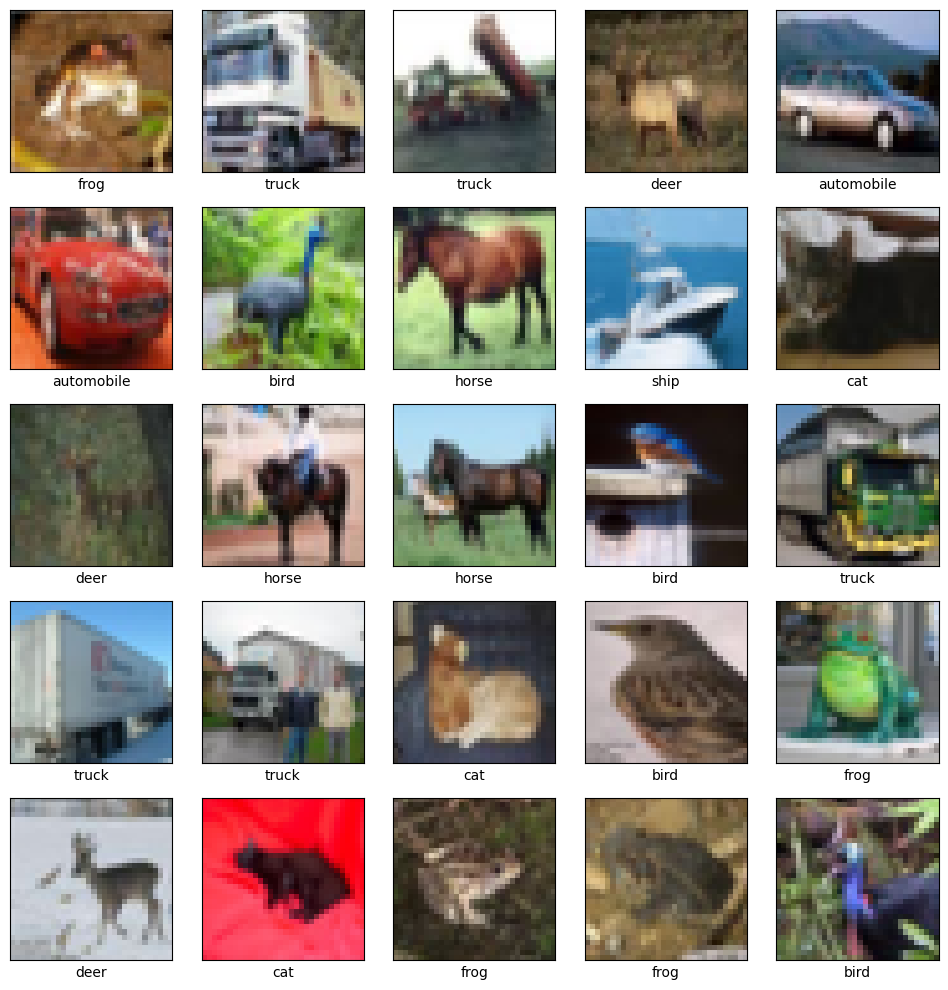

In [6]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.imshow(x_train[i])
    plt.xticks([])
    plt.yticks([])
    plt.xlabel(class_names[y_train[i][0]])
    plt.tight_layout()

In [7]:
y_train = keras.utils.to_categorical(y_train)
y_test = keras.utils.to_categorical(y_test)

In [8]:
y_train[0]

array([0., 0., 0., 0., 0., 0., 1., 0., 0., 0.])

In [9]:
y_train.shape

(50000, 10)

### Model_Building

In [10]:
epochs = 10
n_classes = 10 
batch_size = 1000

In [18]:
model = Sequential()
# CNN Processs
model.add(Conv2D(30,kernel_size=(3,3),activation='relu',input_shape=(32,32,3)))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(14,kernel_size=(3,3),activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Flatten())
# ANN Process
model.add(Dense(504,activation='relu'))
model.add(Dense(350,activation='relu'))
model.add(Dense(n_classes,activation='softmax'))

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 30, 30, 30)          │             840 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 15, 15, 30)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 13, 13, 14)          │           3,794 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 6, 6, 14)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 504)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 504)                 │         254,520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 350)                 │         176,750 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 10)                  │           3,510 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 439,414 (1.68 MB)

 Trainable params: 439,414 (1.68 MB)

 Non-trainable params: 0 (0.00 B)

### Model_compile

In [19]:
model.compile(optimizer=Adam(),loss='categorical_crossentropy',metrics=['accuracy'])

### Model_Validation

In [20]:
history = model.fit(x_train,y_train,epochs=epochs,batch_size=batch_size,validation_data=(x_test,y_test))

Epoch 1/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - accuracy: 0.1262 - loss: 9.2841 - val_accuracy: 0.1730 - val_loss: 2.2442
Epoch 2/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 134ms/step - accuracy: 0.1960 - loss: 2.1939 - val_accuracy: 0.3138 - val_loss: 1.9094
Epoch 3/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 134ms/step - accuracy: 0.3510 - loss: 1.7903 - val_accuracy: 0.3982 - val_loss: 1.6686
Epoch 4/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 135ms/step - accuracy: 0.4476 - loss: 1.5398 - val_accuracy: 0.4444 - val_loss: 1.5512
Epoch 5/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 134ms/step - accuracy: 0.5108 - loss: 1.3737 - val_accuracy: 0.4650 - val_loss: 1.5274
Epoch 6/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 135ms/step - accuracy: 0.5507 - loss: 1.2639 - val_accuracy: 0.4898 - val_loss: 1.4743
Epoch 7/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 134ms/step - accuracy: 0.6076 - loss: 1.1208 - val_accuracy: 0.4864 - val_loss: 1.4842
Epoch 8/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.6393 - loss: 1.0386 - val_accuracy: 0.

In [21]:
model.evaluate(x_test,y_test)

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4955 - loss: 1.5577


[1.547590970993042, 0.5024999976158142]

In [22]:
y_pred = model.predict(x_test)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


In [25]:
np.argmax(y_pred[0])

3

In [23]:
y_pred[0]

array([1.6168512e-02, 1.8814525e-04, 1.2198197e-01, 3.5769185e-01,
       1.2523244e-02, 2.9666859e-01, 5.1935419e-02, 1.3681978e-01,
       5.2394746e-03, 7.8297994e-04], dtype=float32)

In [24]:
y_test[0]

array([0., 0., 0., 1., 0., 0., 0., 0., 0., 0.])

In [26]:
from PIL import Image

In [32]:
# img = Image.open('Thor.jpg')
# img.show()
# img_resized = img.resize((100, 100)) 
# img_resized.show()

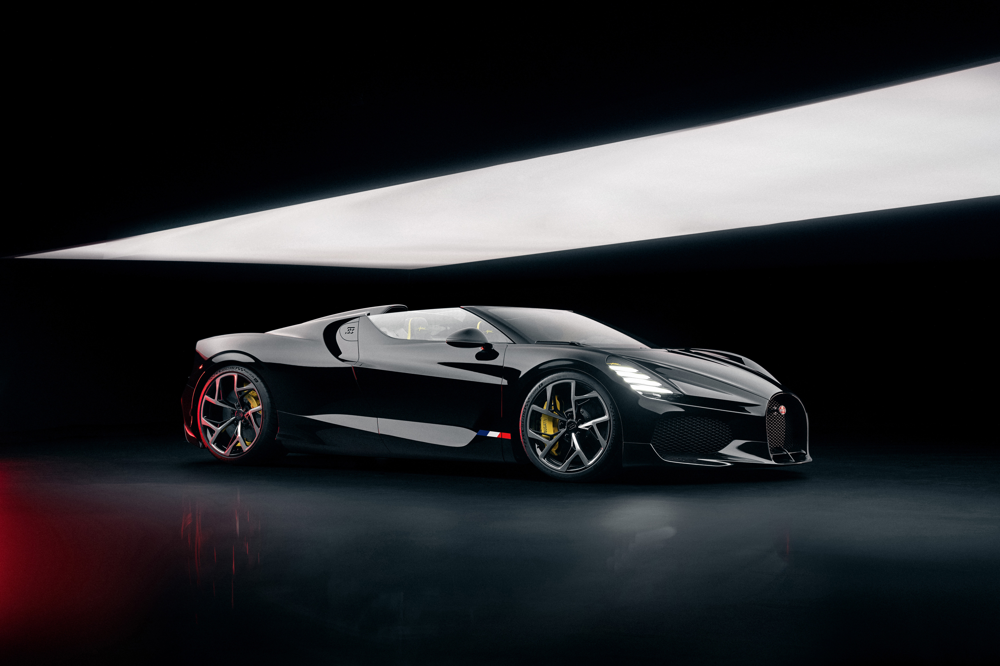

In [43]:
img = Image.open('car.jpeg')
img

In [44]:
img.size

(4500, 3000)

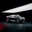

In [45]:
img1 = img.resize((32,32))
img1

In [46]:
img2 = np.expand_dims(img1,axis=0)

In [47]:
class_names[np.argmax(model.predict(img2))]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


'automobile'